# Chocolate Rating Classification
#### CHAPTER 06: _Local Model-agnostic Interpretation Methods_
##### From **[Interpretable Machine Learning with Python](https://www.packtpub.com/product/interpretable-machine-learning-with-python/9781800203907)** by Serg Masís, published by Packt

## The Preparations

### Installing the Libraries

These are all already installed on Google Colab by default so install only if running elsewhere (and ***not already installed***):

In [ ]:
!pip install --upgrade pandas numpy scikit-learn nltk tensorflow lightgbm matplotlib seaborn

Install these if running on Google Colab or ***not already installed***:

In [ ]:
!pip install --upgrade machine-learning-datasets
!pip install --upgrade shap lime

### Loading the Libraries

In [13]:
import math
#import machine_learning_datasets as mldatasets
import pandas as pd
import numpy as np
import re
import nltk
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

In [14]:
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lgarzia\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lgarzia\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


### Understanding and Preparing the Data

In [1]:
import pandas as pd
chocolateratings_df = pd.read_csv(r"C:\Users\lgarzia\Documents\GitHub\explainability\Interpretable-Machine-Learning-with-Python-master\Chapter06\chocolate.csv")

In [2]:
chocolateratings_df.drop(["ref", "Unnamed: 0", "specific_bean_origin_or_bar_name"], axis=1, inplace=True)

In [3]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,blackberry,full body,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,rich cocoa,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_salt,have_not_sugar,have_sweetener_without_sugar,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fatty,mild nuts,mild fruit,NaN


#### Data Preparation

In [7]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.\
                    drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,high roast,high astringnet,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich cocoa,long,NaN
89,creamy,fruit,cocoa,NaN


In [8]:
def make_dummies_with_limits(df, colname, min_recs=0.005,\
                             max_dummies=20, defcatname='Other',\
                             nospacechr='_'):
    if min_recs < 1:
        min_recs = df.shape[0]*min_recs
    topvals_df = df.groupby(colname).size().reset_index(name="counts").\
                    sort_values(by="counts", ascending=False).reset_index()
    other_l = topvals_df[(topvals_df.index > max_dummies) |\
                         (topvals_df.counts < min_recs)][colname].to_list()
    if len(other_l):
        df.loc[df[colname].isin(other_l), colname] = defcatname
    if len(nospacechr):
        df[colname] = df[colname].str.replace(' ',\
                                                  nospacechr, regex=False)
    return pd.get_dummies(df, prefix=[colname], columns=[colname])

def make_dummies_from_dict(df, colname, match_dict, 
                           drop_orig=True, nospacechr='_'):
    if type(match_dict) is list:
        if len(nospacechr):
            match_dict = {match_key:match_key.\
                              replace(' ', nospacechr)\
                              for match_key in match_dict }
        else:
            match_dict = {match_key:match_key\
                              for match_key in match_dict}
    for match_key in match_dict.keys():
        df[colname+'_'+match_dict[match_key]] =\
                    np.where(df[colname].str.contains(match_key), 1, 0)
    if drop_orig:
        return df.drop([colname], axis=1)
    else:
        return df

In [9]:
chocolateratings_df = make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

In [10]:
chocolateratings_df

,company,review_date,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,...,company_location_U.S.A,company_location_U.k.,country_of_bean_origin_Blend,country_of_bean_origin_Dominican_republic,country_of_bean_origin_Ecuador,country_of_bean_origin_Madagascar,country_of_bean_origin_Nicaragua,country_of_bean_origin_Other,country_of_bean_origin_Peru,country_of_bean_origin_Venezuela
0,5150,2019,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,1,0,0,0,0,1,0,0,0,0
1,5150,2019,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,1,0,0,1,0,0,0,0,0,0
2,5150,2019,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,1,0,0,0,0,0,0,1,0,0
3,A. Morin,2012,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,...,0,0,0,0,0,0,0,0,1,0
4,A. Morin,2012,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,2014,80.0,2.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_salt,...,0,0,1,0,0,0,0,0,0,0
2220,Zotter,2017,75.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,0,0,0,0,0,0,0,1,0,0
2221,Zotter,2018,72.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,0,0,0,0,0,0,0,1,0,0
2222,Zotter,2018,70.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,...,0,0,0,0,0,0,0,1,0,0


In [11]:
chocolateratings_df = chocolateratings_df.\
                                drop(['beans'], axis=1)
binary_features = ['cocoa_butter', 'vanilla', 'lecithin', 'salt',\
                   'sugar', 'sweetener_without_sugar']
chocolateratings_df[binary_features] =\
    chocolateratings_df[binary_features].\
        apply(lambda x: np.where(x.str.contains('_not_'), 0, 1))

In [12]:
chocolateratings_df

,company,review_date,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,...,company_location_U.S.A,company_location_U.k.,country_of_bean_origin_Blend,country_of_bean_origin_Dominican_republic,country_of_bean_origin_Ecuador,country_of_bean_origin_Madagascar,country_of_bean_origin_Nicaragua,country_of_bean_origin_Other,country_of_bean_origin_Peru,country_of_bean_origin_Venezuela
0,5150,2019,76.0,3.75,3,1,0,0,0,1,...,1,0,0,0,0,1,0,0,0,0
1,5150,2019,76.0,3.50,3,1,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0
2,5150,2019,76.0,3.25,3,1,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
3,A. Morin,2012,63.0,3.75,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
4,A. Morin,2012,70.0,3.50,4,1,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,2014,80.0,2.75,4,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
2220,Zotter,2017,75.0,3.75,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2221,Zotter,2018,72.0,3.50,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2222,Zotter,2018,70.0,3.25,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [15]:
stop = stopwords.words('english')

In [16]:
trans_dict = {'?':'', '&':'', 'overly intense':'intensest',\
              'overly sweet':'sweetest', 'overly tart':'tartest',\
              'sl. bitter':'bitterness', 'sl. burnt':'burntness',\
              'sl. sweet':'sweetness', 'sl. dry':'dryness',\
              'sl. chalky':'chalkiness', 'sl. Burnt':'burntness',\
              'hints fruit':'fruitiness', 'hint fruit':'fruitiness',\
              'high acid':'acidic', 'high acidity':'acidic',\
              'moderate acidity':'acid', 'high roast':'roast',\
              'astringcy':'astringent', 'astringnet':'astringent',\
              'full body':'robust', 'astringency':'astringent',\
              'high astringent':'acidic', 'rich cocoa':'rich',\
              'mild bitter':'bitterish', 'fruit long':'fruit',\
              'base cocoa':'basic', 'basic cocoa':'basic', '-like':'',\
              'smomkey':'smokey', 'true':'real', '(n)':'', '/':' ',\
              '-':' ', ' +':' ' }
trans_regex = re.compile("|".join(map(re.escape, trans_dict.keys( ))))

In [17]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip().str.lower().\
            apply(lambda s: trans_regex.sub(lambda match:\
                                trans_dict[match.group(0)], s)).\
            apply(lambda s: ' '.join([word for word in s.split()\
                                      if word not in (stop)]))

In [18]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [19]:
print(np.unique(tastes_s).shape)

(2178,)


In [20]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


In [21]:
chocolateratings_df['tastes'] = tastes_s
chocolateratings_df = make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

In [22]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int32  
 6   vanilla                                    2224 non-null   int32  
 7   lecithin                                   2224 non-null   int32  
 8   salt                                       2224 non-null   int32  
 9   sugar                                      2224 non-null   int32  
 10  sweetener_without_sugar 

In [27]:
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

In [28]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

In [31]:
def evaluate_class_mdl(fitted_model, X_train, X_test, y_train, y_test, plot_roc=True, plot_conf_matrix=False,\
                       pct_matrix=True, predopts={}, show_summary=True, ret_eval_dict=False):
    y_train_pred = fitted_model.predict(X_train, **predopts).squeeze()
    if len(np.unique(y_train_pred)) > 2:
        y_train_pred = np.where(y_train_pred > 0.5, 1, 0)
        y_test_prob = fitted_model.predict(X_test, **predopts).squeeze()
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    else:   
        y_test_prob = fitted_model.predict_proba(X_test, **predopts)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
        
    roc_auc = metrics.roc_auc_score(y_test, y_test_prob)
    if plot_roc:
        plt.figure(figsize = (12,12))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
        fpr, tpr, _ = metrics.roc_curve(y_test, y_test_prob)
        plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
        plt.xlabel('False Positive Rate', fontsize = 14)
        plt.ylabel('True Positive Rate', fontsize = 14)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.legend(loc="lower right")
        plt.show()
    
    if plot_conf_matrix: 
        cf_matrix = metrics.confusion_matrix(y_test,\
                                             y_test_pred)
        plt.figure(figsize=(6, 5))
        if pct_matrix:
            sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
                        fmt='.2%', cmap='Blues', annot_kws={'size':16})
        else:
            sns.heatmap(cf_matrix, annot=True,\
                        fmt='d',cmap='Blues', annot_kws={'size':16})
        plt.show()
    
    if show_summary:
        print('Accuracy_train:  %.4f\t\tAccuracy_test:   %.4f' %\
                            (metrics.accuracy_score(y_train, y_train_pred),\
                             metrics.accuracy_score(y_test, y_test_pred)))
        print('Precision_test:  %.4f\t\tRecall_test:     %.4f' %\
                            (metrics.precision_score(y_test, y_test_pred, zero_division=0),\
                             metrics.recall_score(y_test, y_test_pred, zero_division=0)))
        print('ROC-AUC_test:    %.4f\t\tF1_test:         %.4f\t\tMCC_test: %.4f' %\
                            (roc_auc,\
                             metrics.f1_score(y_test, y_test_pred, zero_division=0),\
                             metrics.matthews_corrcoef(y_test, y_test_pred)))
    if ret_eval_dict:
        return evaluate_class_metrics_mdl(fitted_model, y_train_pred, y_test_prob, y_test_pred, y_train, y_test)
    else:
        return y_train_pred, y_test_prob, y_test_pred

## Leveraging SHAP’s KernelExplainer for Local Interpretations with SHAP Values

### Train C-Support Vector Classification Model

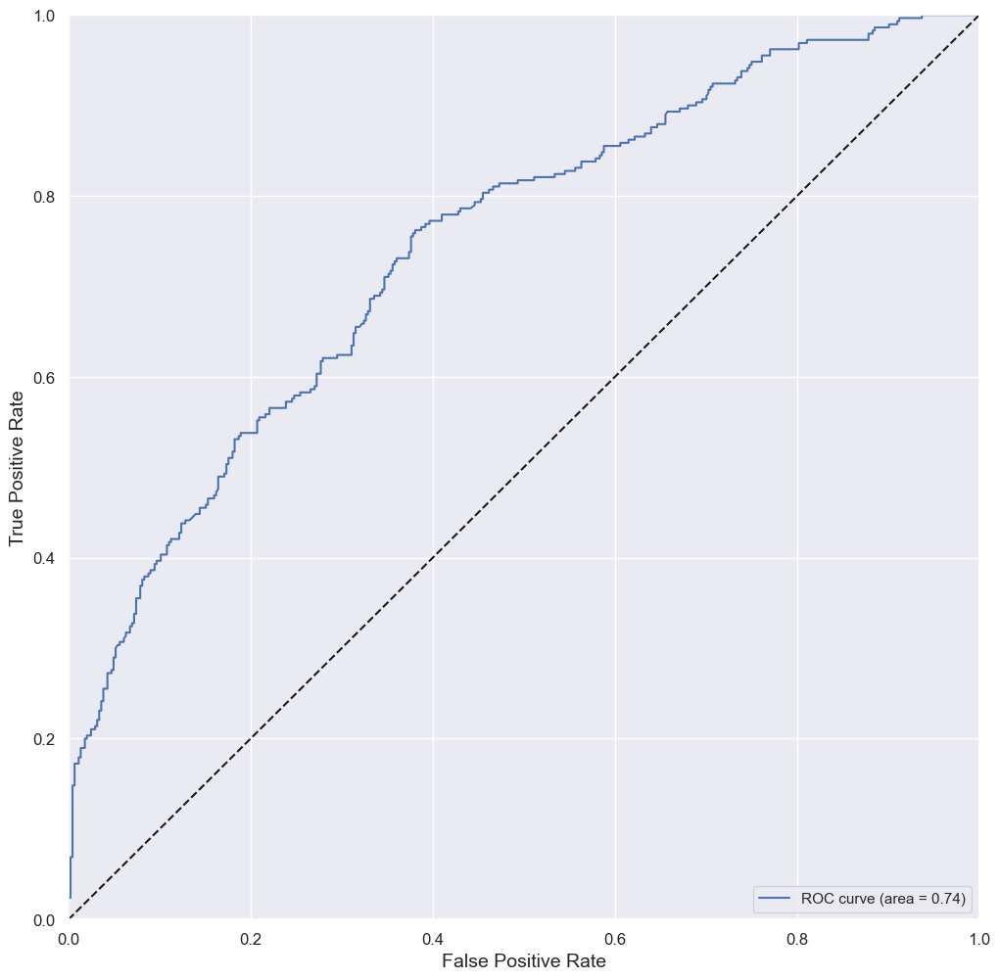

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [32]:
orig_plt_params = plt.rcParams
sns.set()
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                      X_test, y_train, y_test)

### Computing SHAP Values using KernelExplainer

In [33]:
print(svm_mdl.classes_)

[0 1]


The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
X does not have valid feature names, but SVC was fitted with feature names


  0%|          | 0/734 [00:00<?, ?it/s]

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid fea

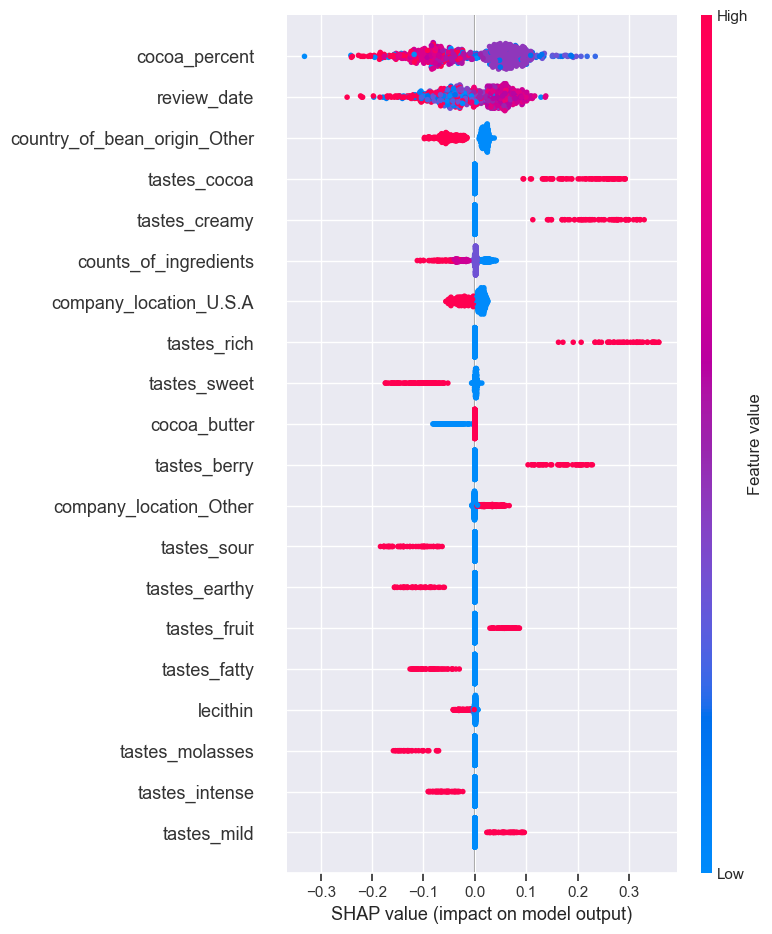

In [34]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

### Local Interpretation for a group of predictions using Decision Plots

In [35]:
sample_test_idx = X_test.index.\
                    get_indexer_for([5,6,7,18,19,21,24,25,27])

In [36]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


In [37]:
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

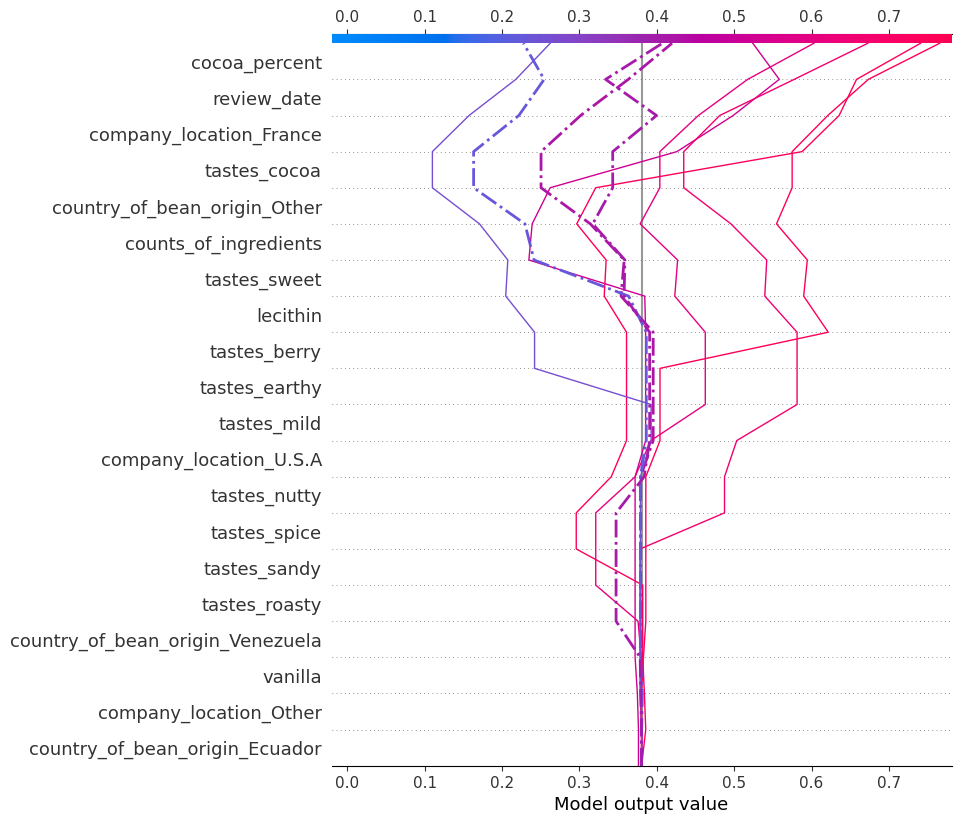

In [38]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

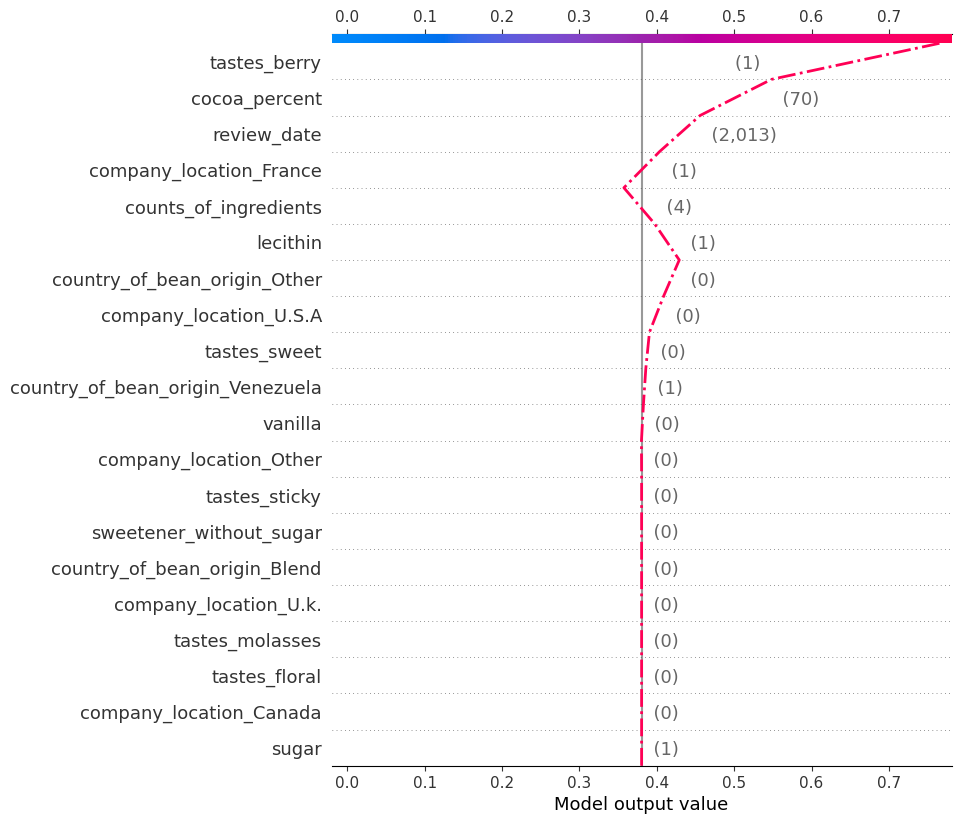

In [39]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

### Local Interpretation for a single prediction at a time using Force Plot

In [40]:
eval_idxs = (X_test.index==5) | (X_test.index==24)
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,24,5
rating,2.75,4.0
y,0.00,1.0
y_pred,0.00,1.0
review_date,2015.00,2013.0
cocoa_percent,70.00,70.0
counts_of_ingredients,4.00,4.0
cocoa_butter,1.00,1.0
vanilla,0.00,0.0
lecithin,1.00,1.0
salt,0.00,0.0


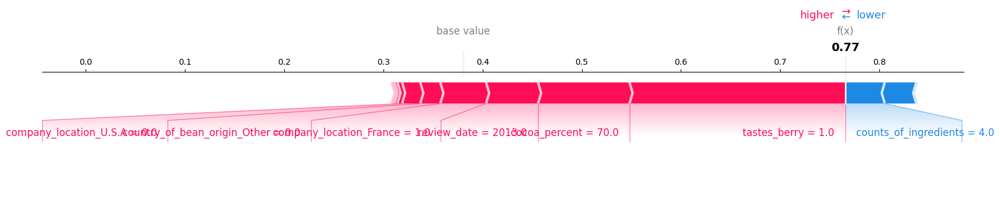

In [41]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5],  matplotlib=True)

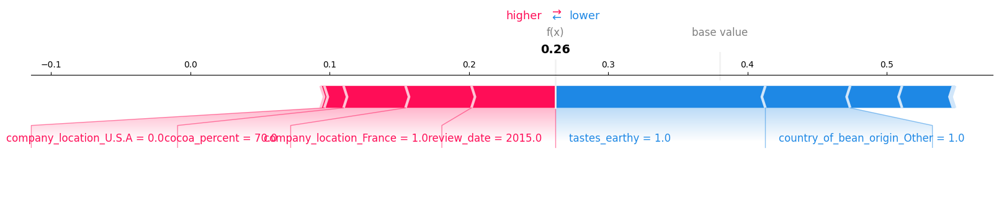

In [42]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24], matplotlib=True)

## Employing Local Interpretable Model-agnostic Explanations (LIME)

### Local Interpretation for a single prediction at a time using LimeTabularExplainer

In [43]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [44]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


In [45]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


## Using LIME for Natural Language Processing

In [46]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [47]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

In [48]:
type(X_test_nlp_fit)

scipy.sparse._csr.csr_matrix

In [53]:
X_test_nlp_fit.todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [50]:
pd.DataFrame({'taste':vectorizer.get_feature_names_out(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000
...,...,...
136,empty,0.000000
135,edge,0.000000
134,easy,0.000000
133,easter,0.000000


### Train LightGBM Model

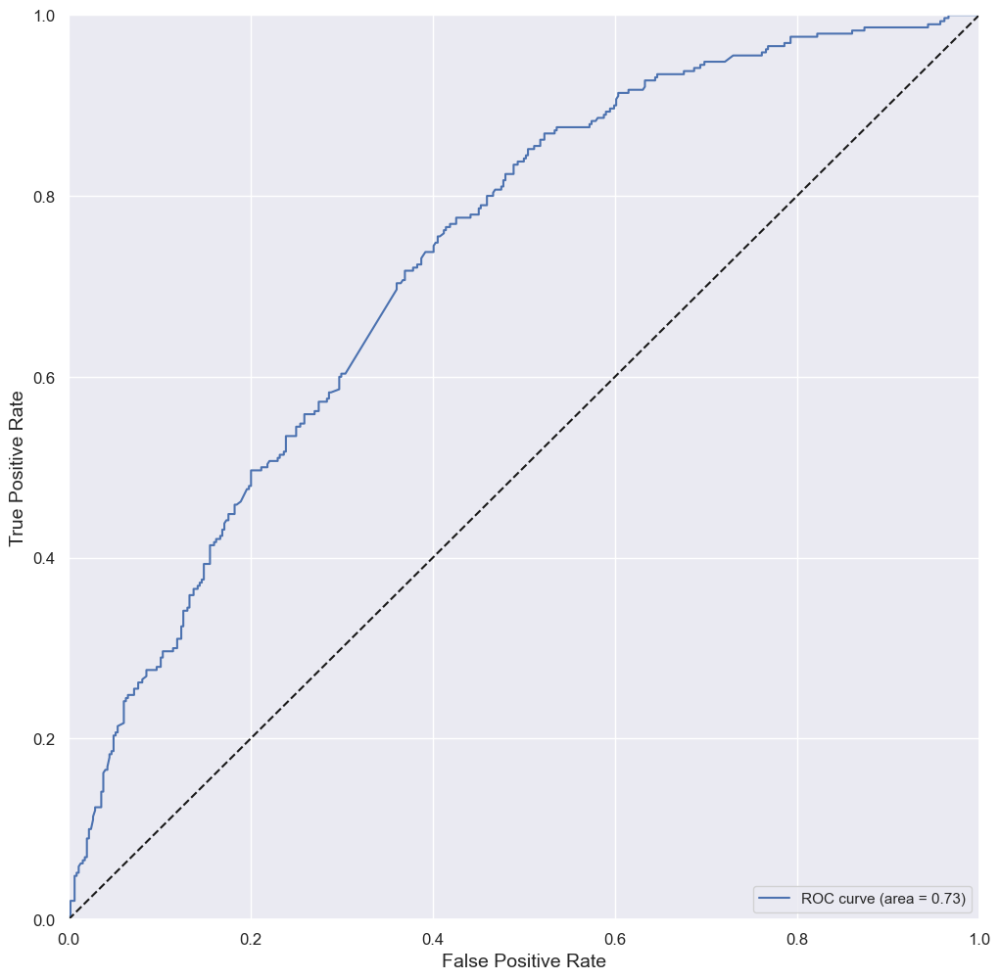

Accuracy_train:  0.7980		Accuracy_test:   0.6744
Precision_test:  0.6123		Recall_test:     0.4793
ROC-AUC_test:    0.7300		F1_test:         0.5377		MCC_test: 0.2973


In [54]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                  X_test_nlp_fit, y_train, y_test)

### Local Interpretation for a single prediction at a time using LimeTextExplainer

In [55]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [56]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [57]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [58]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [59]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

## Trying SHAP for Natural Language Processing

In [60]:
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


  0%|          | 0/50 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


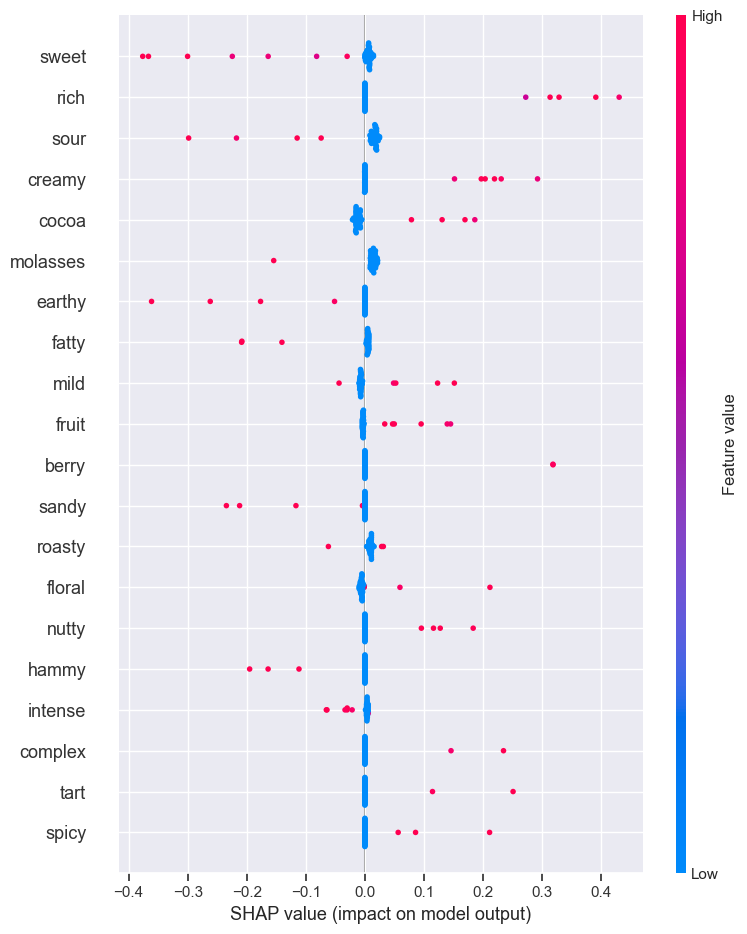

In [63]:
X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.toarray(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names_out())

In [64]:
print(shap.sample(X_test_nlp, 50).to_list()[18])

woody earthy medicinal


In [66]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[18,:], 
                X_test_nlp_samp_df.iloc[18,:], feature_names=vectorizer.get_feature_names_out())

In [67]:
print(shap.sample(X_test_nlp, 50).to_list()[9])

intense spicy floral


In [69]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[9,:], 
                X_test_nlp_samp_df.iloc[9,:], feature_names=vectorizer.get_feature_names_out())